In [1]:
'''
 * User: Hojun Lim
 * Date: 2020-06-15
'''
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.image as mpimg
from PIL import Image 
import numpy as np
import os  

In [11]:
def plot_MC_DE_PU_figures(img_path_MC, img_path_DE, img_path_PU, title):
    img_MC = mpimg.imread(img_path_MC)
    img_DE = mpimg.imread(img_path_DE)
    img_PU = mpimg.imread(img_path_PU)
    
    f, axes = plt.subplots(1, 3, figsize=(50, 50))
    #plt.suptitle(title, fontsize = 30)
    
    axes[0].imshow(img_MC)
    axes[0].axis('off')
    axes[0].set_title('MC Dropout', fontsize=40)

    axes[1].imshow(img_DE)
    axes[1].axis('off')
    axes[1].set_title('Deep Ensemble', fontsize=40)

    axes[2].imshow(img_PU)
    axes[2].axis('off')
    axes[2].set_title('Parametric Uncertainty', fontsize=40)

    plt.show()
    
    
def plot_MC_DE_figures(img_path_MC, img_path_DE, title):
    img_MC = mpimg.imread(img_path_MC)
    img_DE = mpimg.imread(img_path_DE)
    
    
    f, axes = plt.subplots(1, 2, figsize=(50, 50))
    #plt.suptitle(title, fontsize = 30)
    
    axes[0].imshow(img_MC)
    axes[0].axis('off')
    axes[0].set_title('MC Dropout', fontsize=40)

    axes[1].imshow(img_DE)
    axes[1].axis('off')
    axes[1].set_title('Deep Ensemble', fontsize=40)

    plt.show()

        
def plot_DE_figures(img_path_DE, title):
    
    img_DE = mpimg.imread(img_path_DE)
    plt.figure(figsize=(20,20))
    plt.axis('off')
    plt.title('Deep Ensemble', fontsize=30)
    plt.imshow(img_DE)
    
    
    #f, axes = plt.subplots(1, 1, figsize=(50, 50))
    #plt.suptitle(title, fontsize = 30)
    
    #axes[0].imshow(img_DE)
    #axes[0].axis('off')
    #axes[0].set_title('MC Dropout', fontsize=40)


    plt.show()

def find_index(list ,substring):
    for idx, value in enumerate(list):
        if substring in value:
            return idx

    return None

def get_DE_MC_PU_img_path(figure_type, DE_output_path, MC_output_path, PU_output_path):
    """
    return the paths for the figures that are from DE, MC, and PU given figure type
    """
    
    list = os.listdir(DE_output_path)
    idx = find_index(list, figure_type)
    img_path_DE = os.path.join(DE_output_path, list[idx])     
        
    list = os.listdir(MC_output_path)
    idx = find_index(list, figure_type)
    img_path_MC = os.path.join(MC_output_path, list[idx])     
        
        
    list = os.listdir(PU_output_path)
    idx = find_index(list, figure_type)
    img_path_PU = os.path.join(PU_output_path, list[idx])             
    
    return (img_path_DE, img_path_MC, img_path_PU)

def get_DE_MC_img_path(figure_type, DE_output_path, MC_output_path ):
    """
    return the paths for the figures that are from DE and MC given figure type
    """
    list = os.listdir(DE_output_path)
    idx = find_index(list, figure_type)
    img_path_DE = os.path.join(DE_output_path, list[idx])     
        
    list = os.listdir(MC_output_path)
    idx = find_index(list, figure_type)
    img_path_MC = os.path.join(MC_output_path, list[idx])     
    
    return (img_path_DE, img_path_MC)

def get_DE_img_path(figure_type, DE_output_path):
    """
    return the path for the figures that are from DE given figure type
    """
    
    list = os.listdir(DE_output_path)
    idx = find_index(list, figure_type)
    img_path_DE = os.path.join(DE_output_path, list[idx])    
    
    return img_path_DE




In [3]:
datasets = {'boston':[], 'concrete':[],'energy':[],'kin8nm':[],'naval':[],'power_plant':[],'protein':[],'wine':[],'yacht':[]
    #,'year':[]
    }

DE_output = {}
DE_output_test ={}
DE_output_train ={}

MC_output = {}
MC_output_test = {}
MC_output_train = {}

PU_output = {}
PU_output_test = {}
PU_output_train = {}

for key in datasets: #storing directories to get the figures of test set and train set from DE, MC, PU model, respectively.
    DE_output[key] = os.path.join('output_de', key, 'eval', 'figures')
    DE_output_test[key] = os.path.join(DE_output[key], 'test')
    DE_output_train[key] = os.path.join(DE_output[key], 'train')
    
    MC_output[key] = os.path.join('output_mc', key, 'figures')
    MC_output_test[key] = os.path.join(MC_output[key], 'test')
    MC_output_train[key] = os.path.join(MC_output[key], 'train')
    
    PU_output[key] = os.path.join('output_pu', key, 'parametric_uncertainty', 'figures')
    PU_output_test[key] = os.path.join(PU_output[key], 'test')
    PU_output_train[key] = os.path.join(PU_output[key], 'train')

    
common_figure_types = [ 'GT-mean_and_std', 'NLL_RMSE_histogram', 'NLL_RMSE_scatter']
DE_MC_figure_types = ['Assesment of Uncertainty Realism.png', 'Realism with Chi PDF']
DE_figure_types = ['target_norm_histogram']



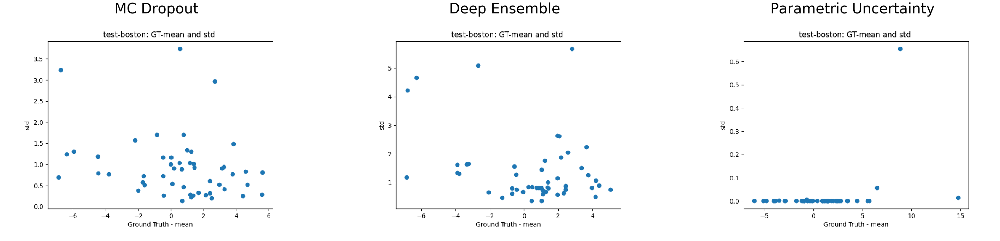

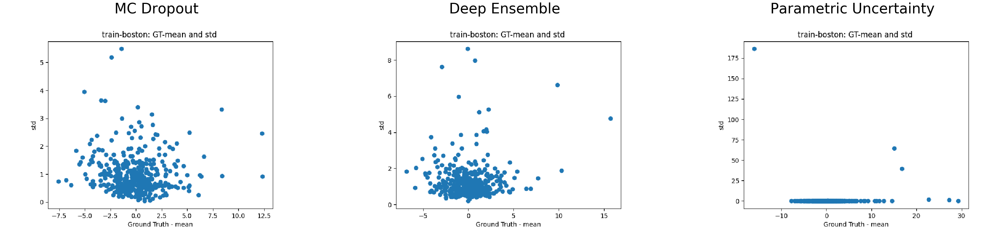

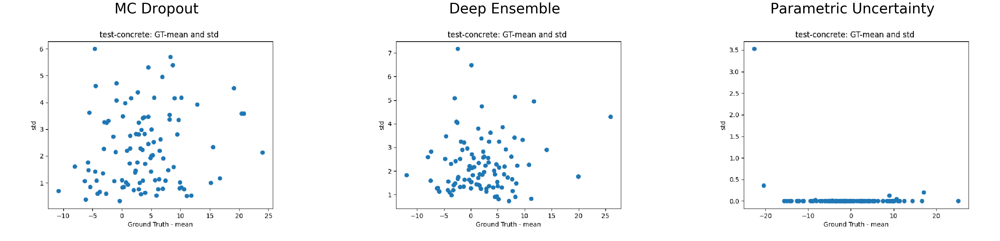

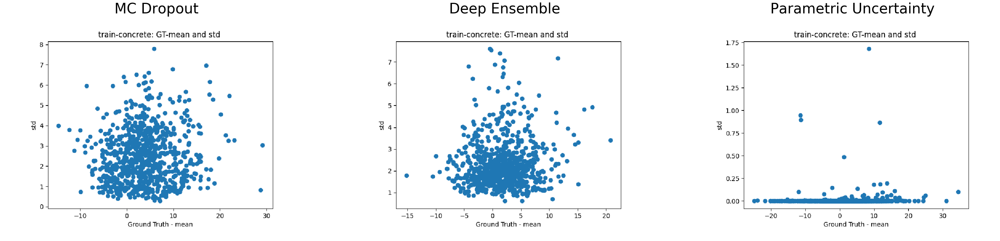

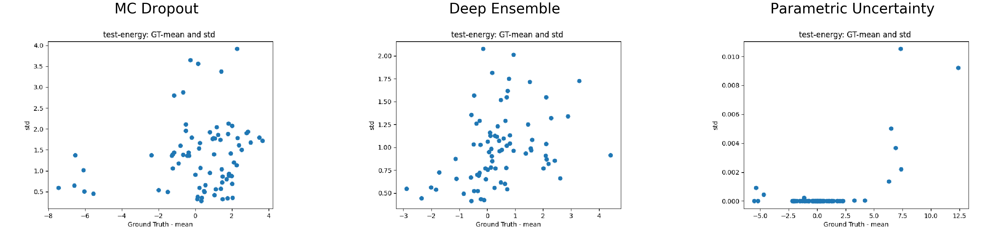

...

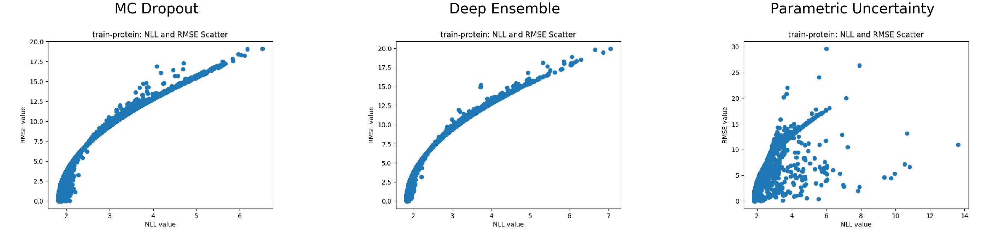

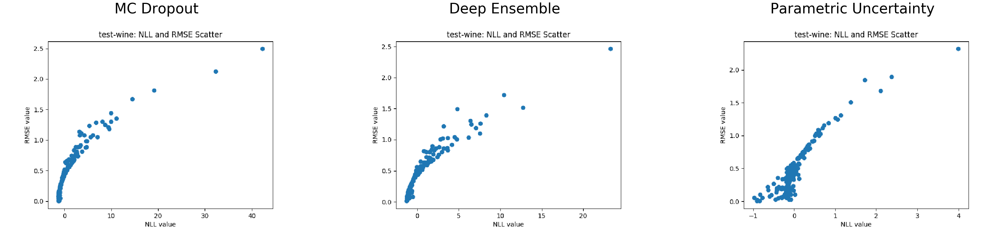

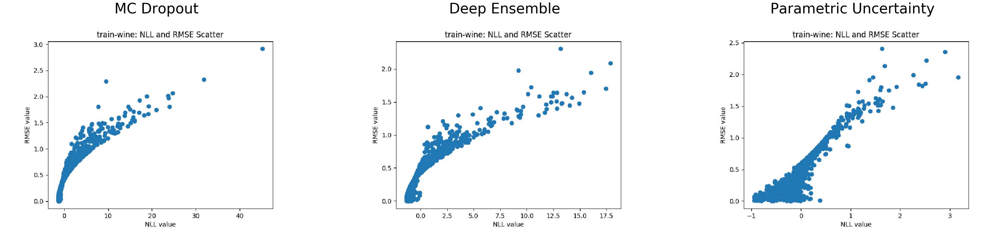

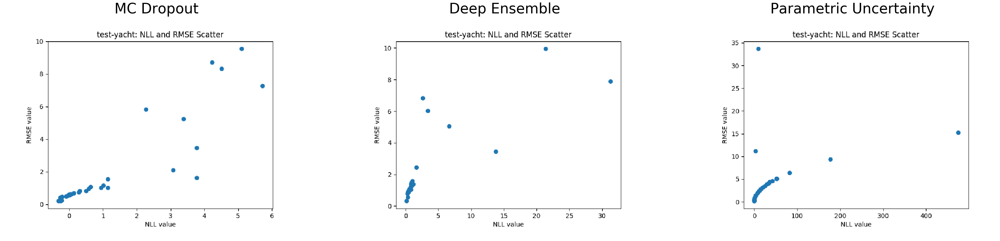

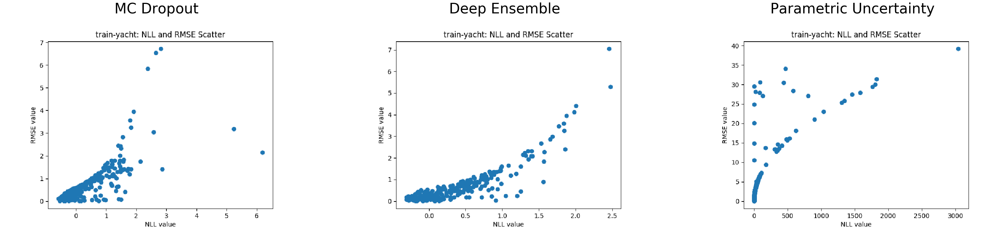

In [4]:

for figure_type in common_figure_types:
    for key in datasets:
        
        img_path_DE, img_path_MC, img_path_PU = get_DE_MC_PU_img_path(figure_type, DE_output_test[key], MC_output_test[key], PU_output_test[key])
        plot_MC_DE_PU_figures(img_path_MC, img_path_DE, img_path_PU, figure_type+' Test')
        
        img_path_DE, img_path_MC, img_path_PU = get_DE_MC_PU_img_path(figure_type, DE_output_train[key], MC_output_train[key], PU_output_train[key])
        plot_MC_DE_PU_figures(img_path_MC, img_path_DE, img_path_PU, figure_type+' Train')
        
        

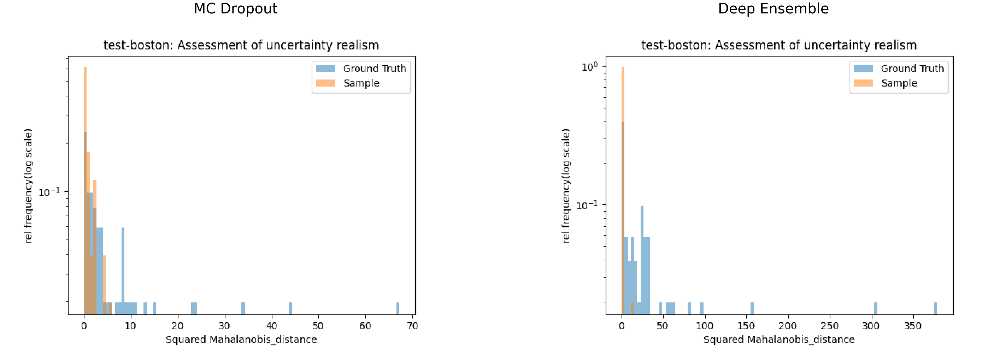

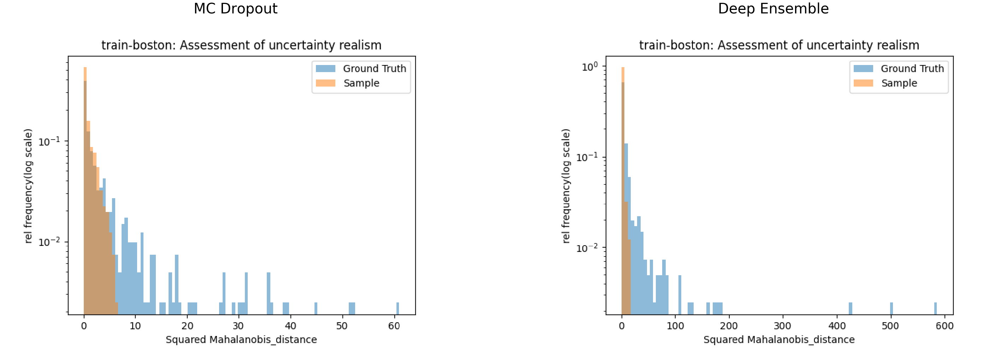

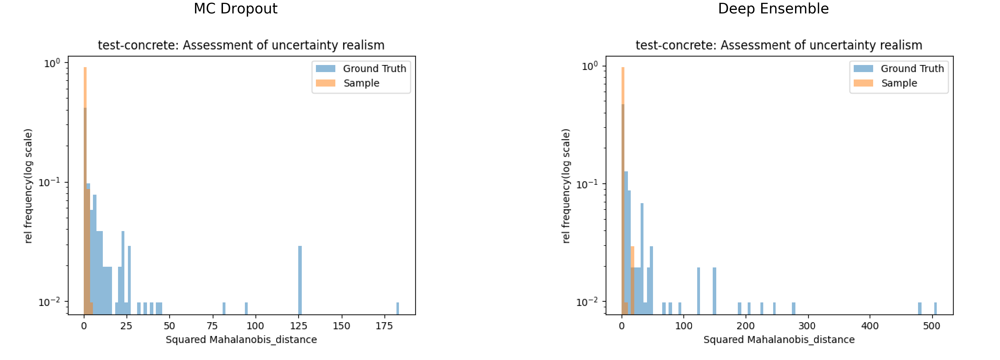

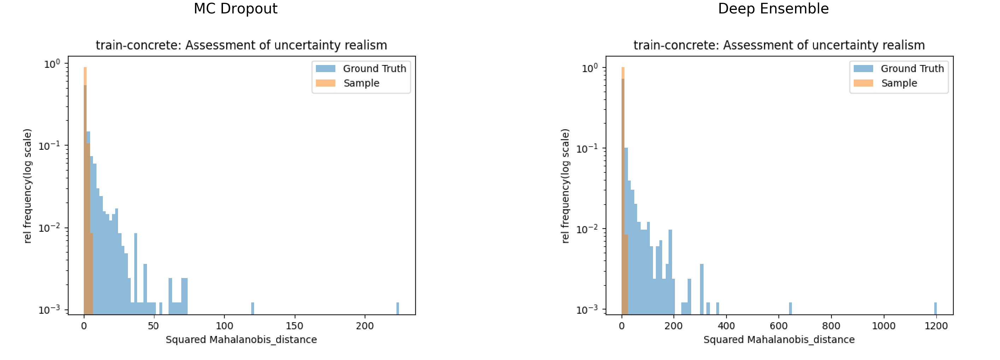

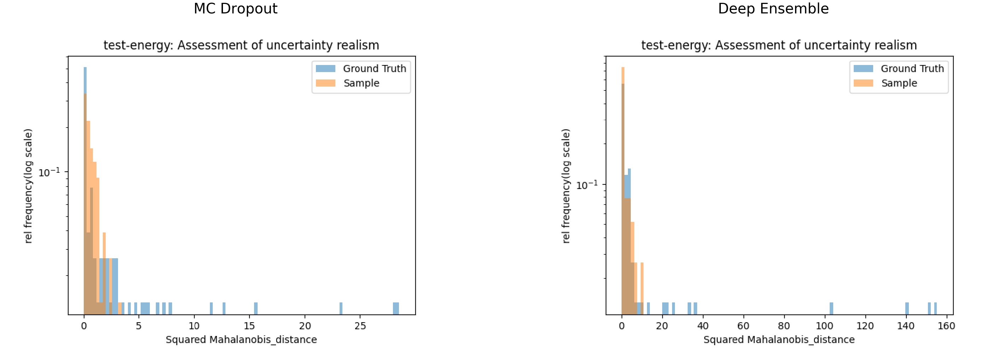

...

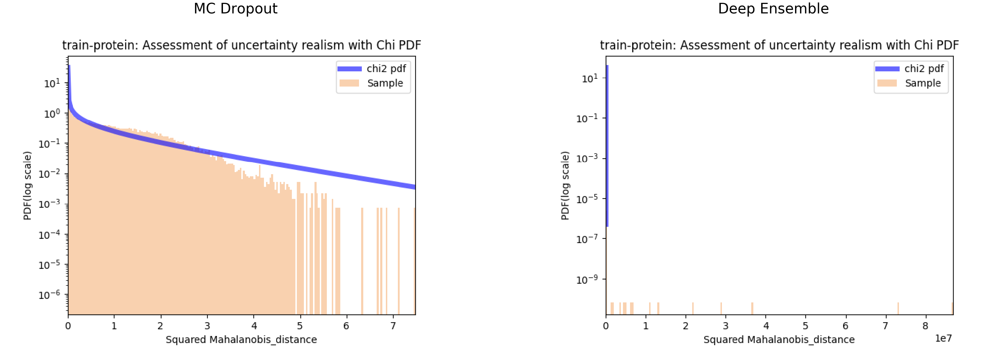

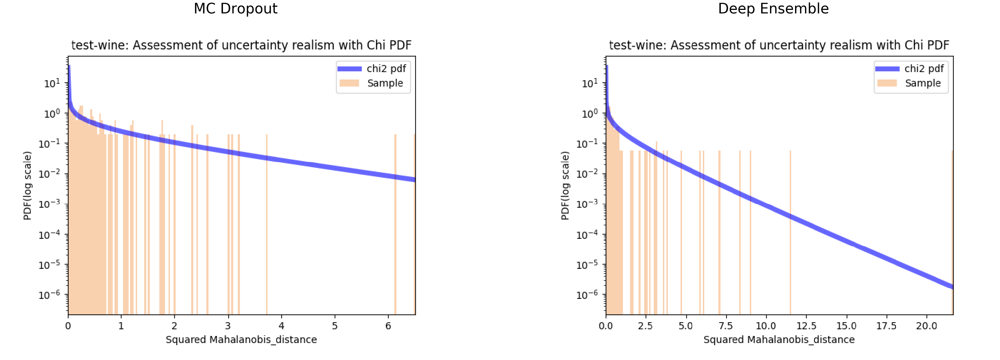

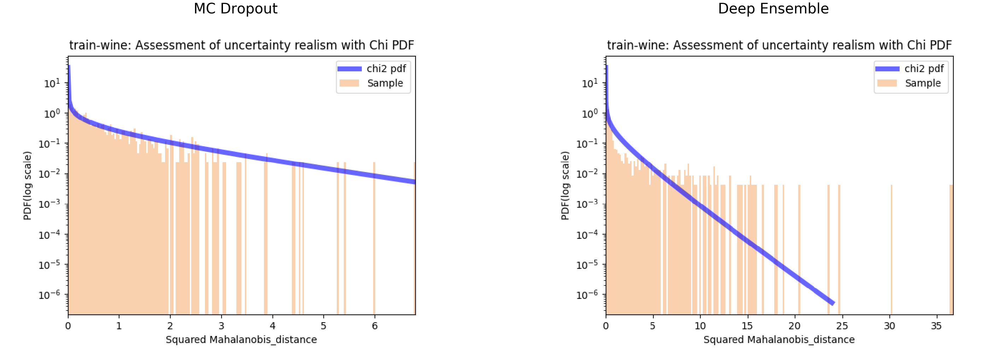

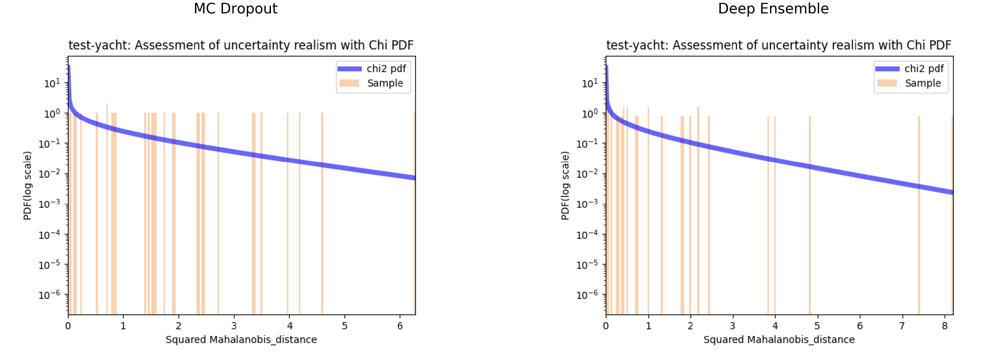

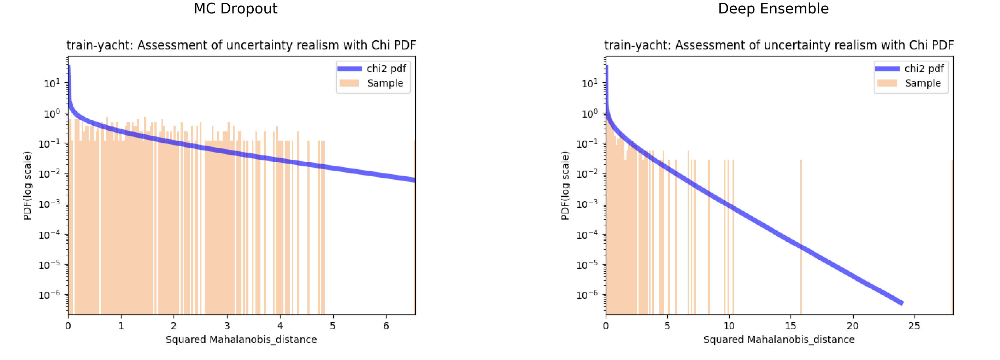

In [5]:

for figure_type in DE_MC_figure_types:
    for key in datasets:

        img_path_MC, img_path_DE = get_DE_MC_img_path(figure_type, DE_output_test[key], MC_output_test[key])
        plot_MC_DE_figures(img_path_MC, img_path_DE, figure_type+' Test')
        
        img_path_MC, img_path_DE = get_DE_MC_img_path(figure_type, DE_output_train[key], MC_output_train[key])
        plot_MC_DE_figures(img_path_MC, img_path_DE, figure_type+' Train')



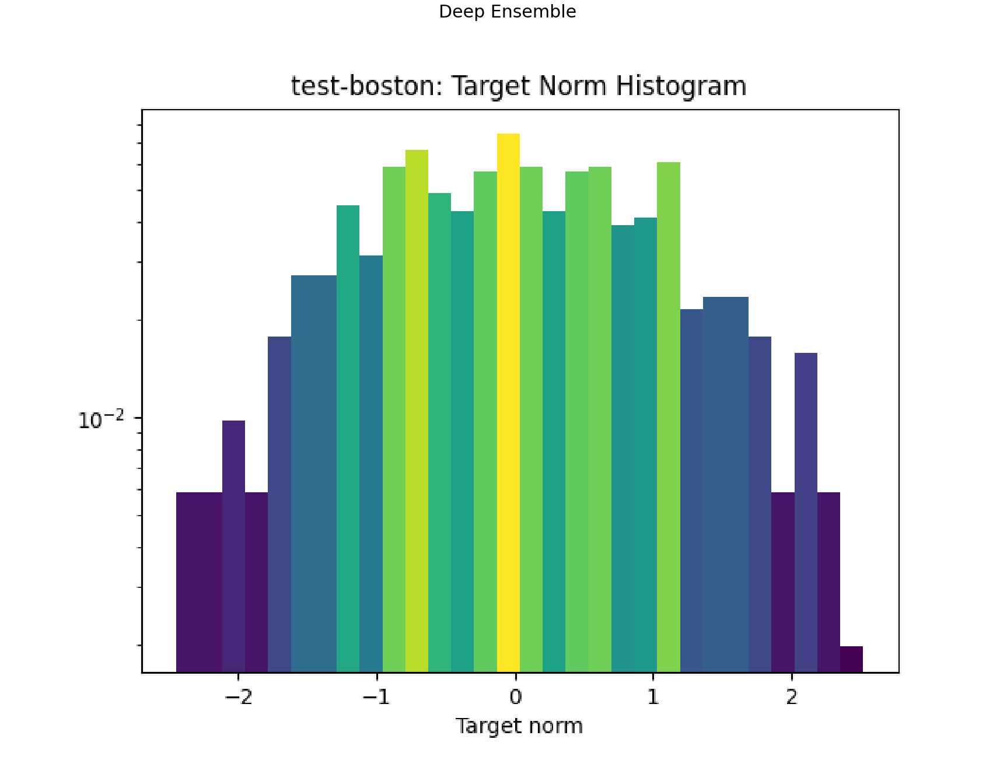

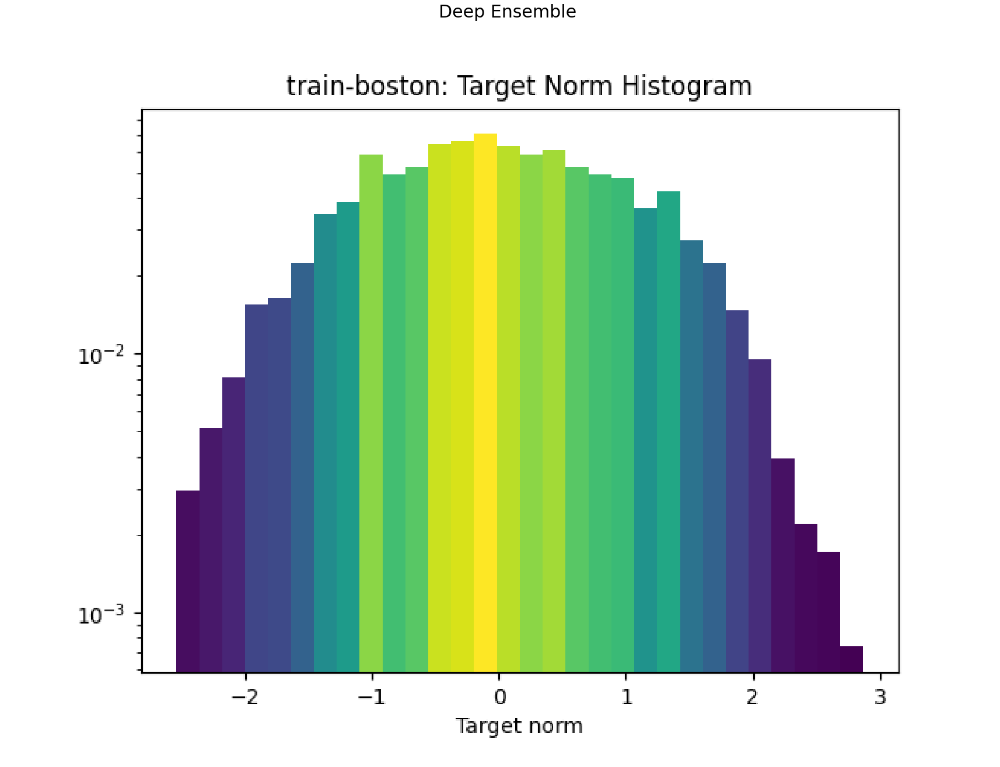

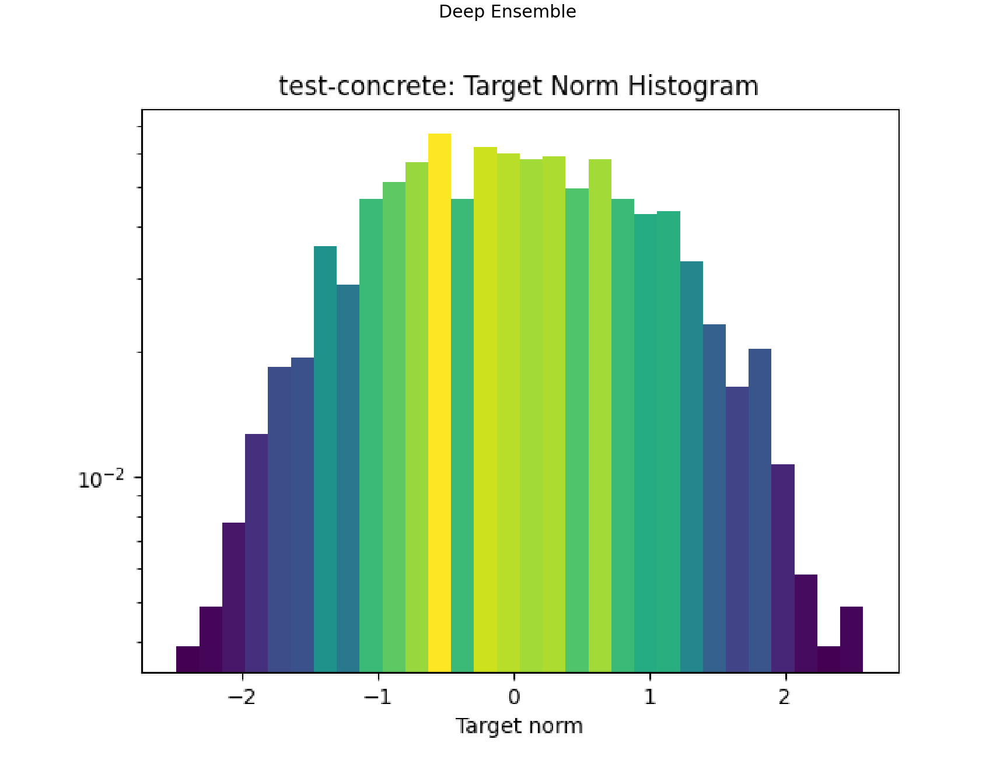

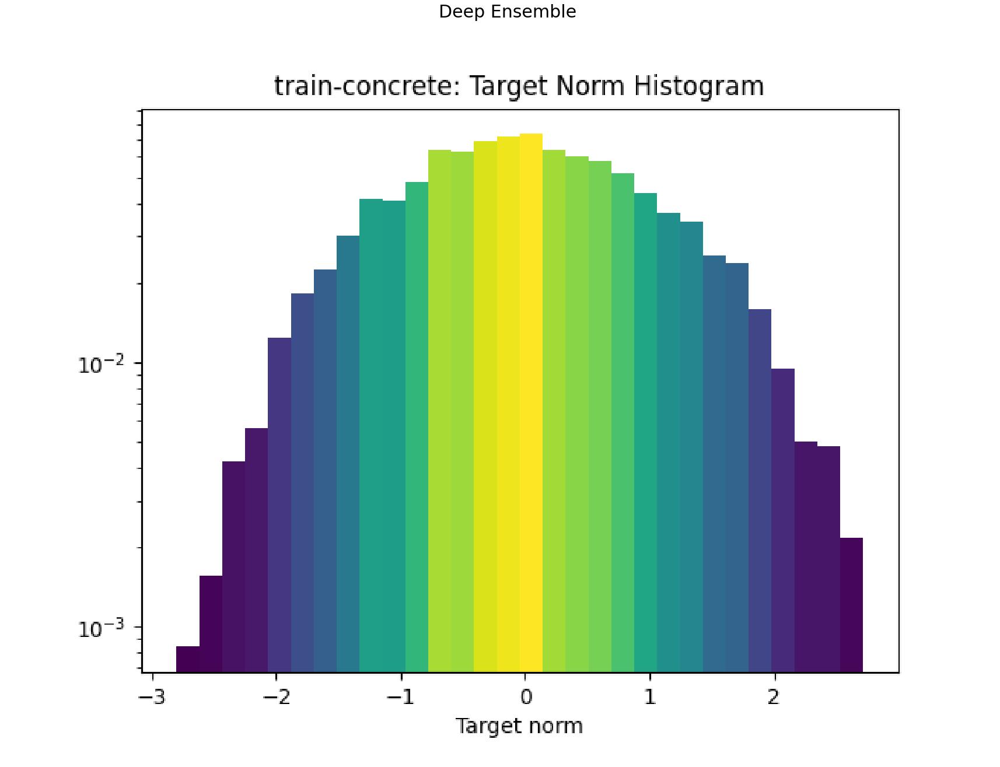

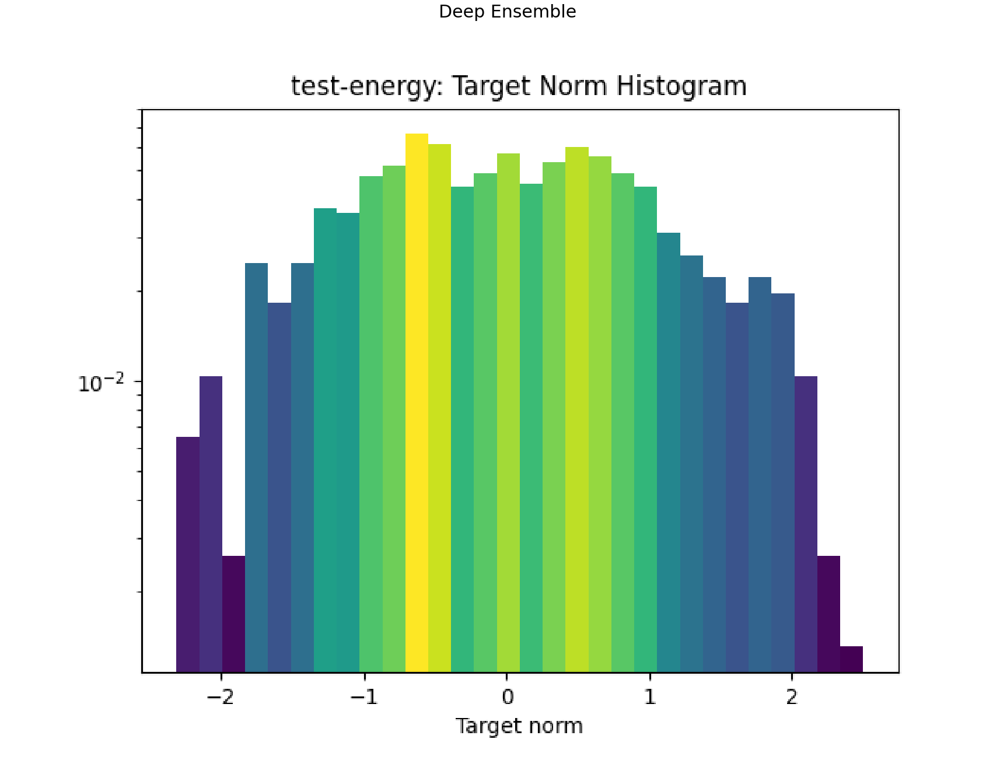

...

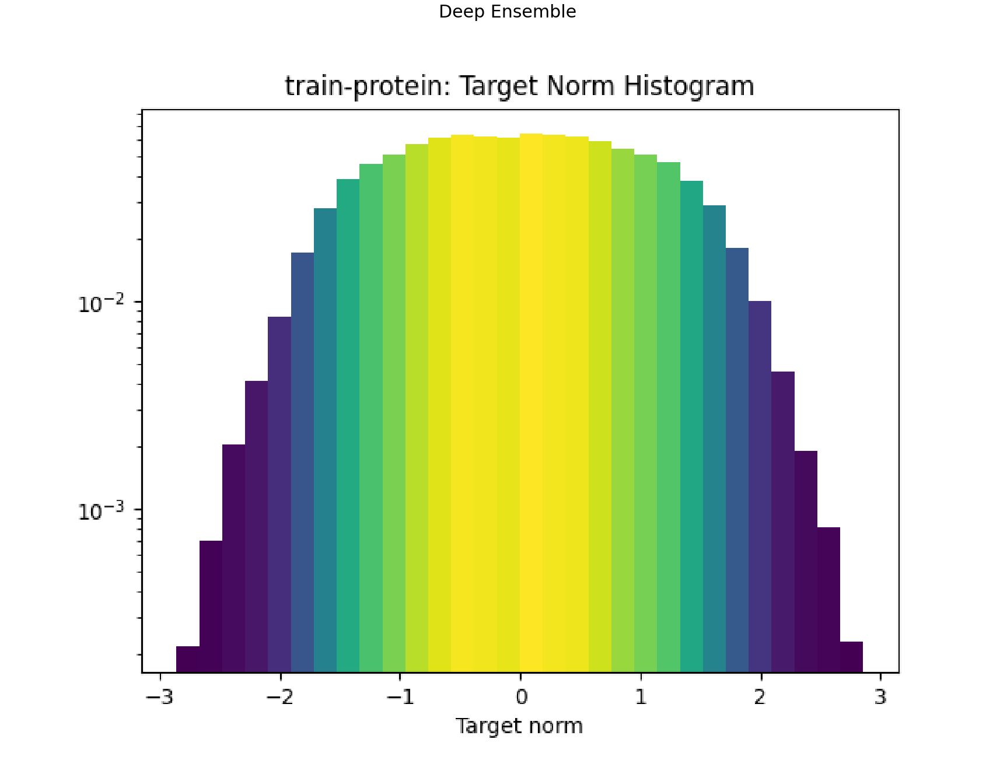

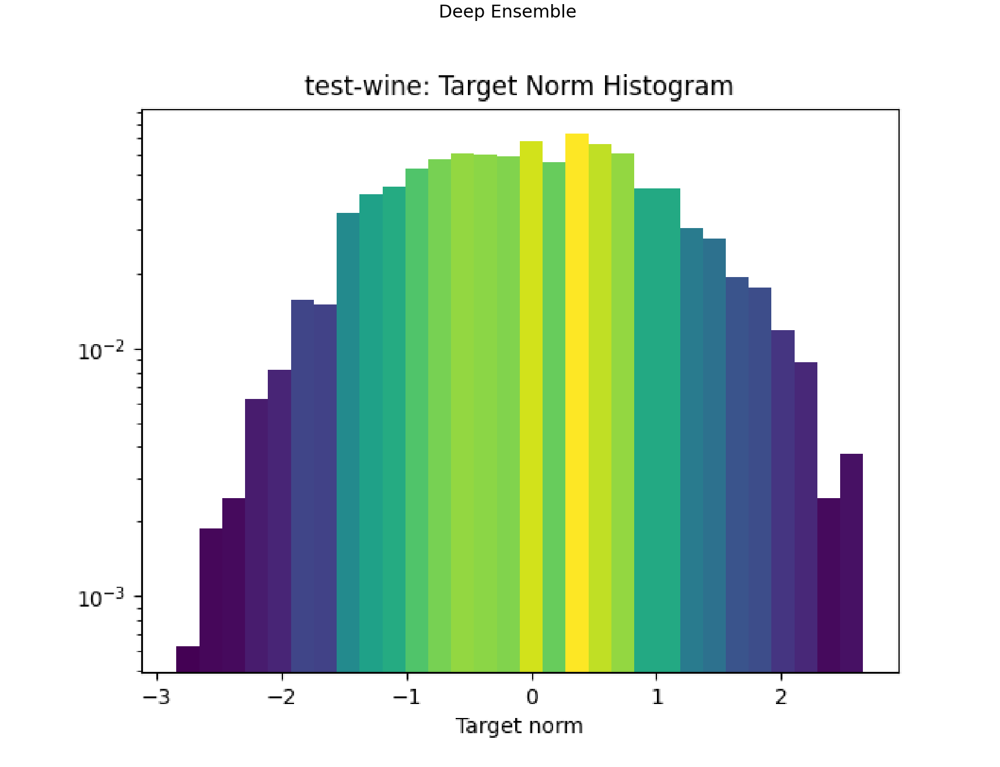

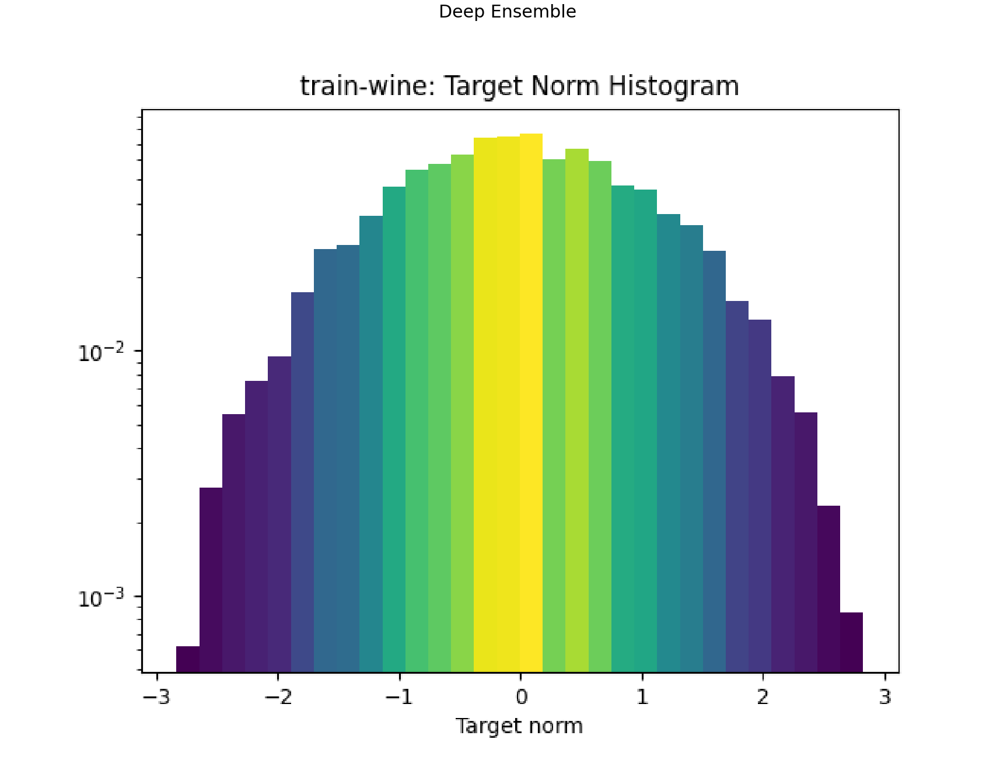

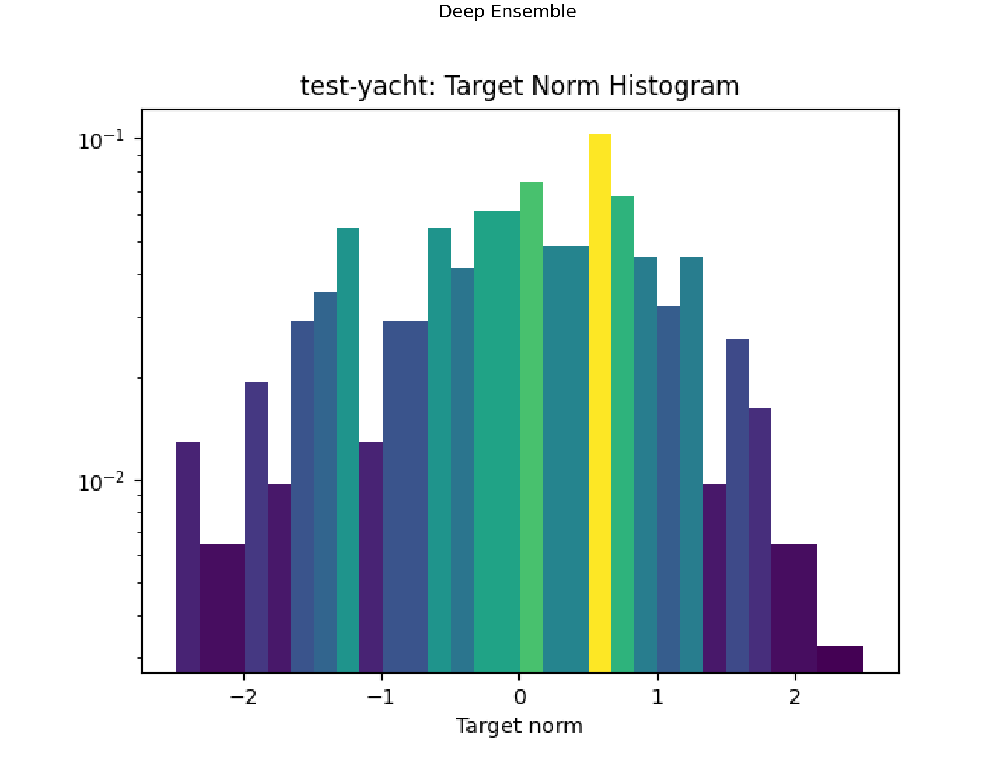

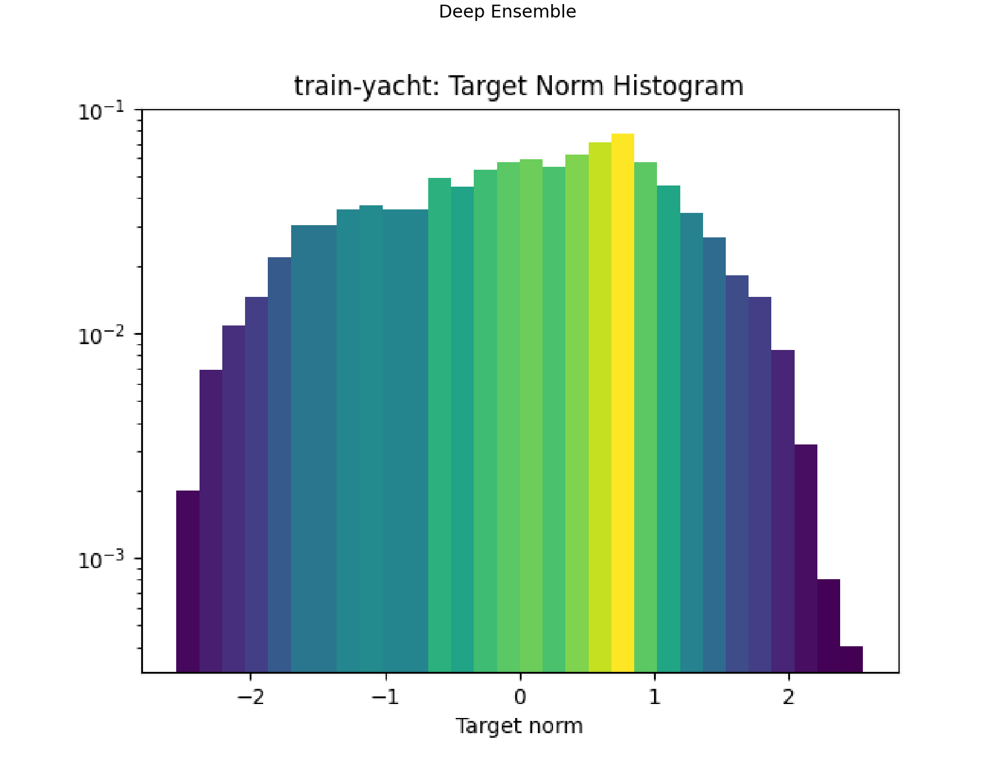

In [13]:

for figure_type in DE_figure_types:
    for key in datasets:
        
        img_path_DE = get_DE_img_path(figure_type, DE_output_test[key])
        plot_DE_figures(img_path_DE, figure_type+' Test')
        
        img_path_DE = get_DE_img_path(figure_type, DE_output_train[key])
        plot_DE_figures(img_path_DE, figure_type+' Train')
